# Introduction to Convolutional Neural Networks and  Computer Vision with TensorFlow

#  *Convolutional Neural Network*

Computer vision is the practice of writing algorithms which can discover patterns in visual data. Such as the camera of a self-driving car recognizing the car in front.

In [1]:
import tensorflow as tf
print(tf.__version__)

2.10.1


In [2]:
import numpy as np
print(np.__version__)

1.24.1


## **Get The Data**

## **Inspect the data (become one with it)**

A very crucial step at the beginning of any machine learning project is becoming one with the data.

And for a computer vision project.... this usually means visualizing many samples of your data.

In [3]:
ls pizza_steak

 Volume in drive C has no label.
 Volume Serial Number is B64C-5069

 Directory of C:\Users\gtech\Tenserflow\Convolutional Neural Networks\01--\pizza_steak

31-12-2022  15:03    <DIR>          .
02-01-2023  19:15    <DIR>          ..
31-12-2022  15:03    <DIR>          test
31-12-2022  15:03    <DIR>          train
               0 File(s)              0 bytes
               4 Dir(s)  85,900,709,888 bytes free


In [4]:
import os

# Walk through pizza_steak dictionary and list number of files
for dirpath, dirnames,filenames in os.walk("pizza_steak"):
    print(f"There are {len(dirnames)} directories and {len(filenames)} image in {dirpath}.")
    

There are 2 directories and 0 image in pizza_steak.
There are 2 directories and 0 image in pizza_steak\test.
There are 0 directories and 250 image in pizza_steak\test\pizza.
There are 0 directories and 250 image in pizza_steak\test\steak.
There are 2 directories and 0 image in pizza_steak\train.
There are 0 directories and 750 image in pizza_steak\train\pizza.
There are 0 directories and 750 image in pizza_steak\train\steak.


In [5]:
# os listdir
os.listdir('pizza_steak/train/steak')[:10]

['1000205.jpg',
 '100135.jpg',
 '101312.jpg',
 '1021458.jpg',
 '1032846.jpg',
 '10380.jpg',
 '1049459.jpg',
 '1053665.jpg',
 '1068516.jpg',
 '1068975.jpg']

In [6]:
# Another way to find out how many images are in a file
num_steak_images_train = len(os.listdir('pizza_steak/train/steak'))

num_steak_images_train

750

To visualize our images,first let's get the class name programmatically.

In [7]:
# Import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf


In [8]:
import pathlib 
data_dir = pathlib.Path('pizza_steak/train')
class_name = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_name)


['pizza' 'steak']


In [9]:
# Let's visualize our image
import random

def view_random_image(target_dir,target_class):
    
    # Setup target directory (we'll view images from here)
    target_folder = target_dir + target_class


    # Get a random image path
    random_image = random.sample(os.listdir(target_folder),1)


    # Read in the image and plot it using matplotlib
    img = mpimg.imread(target_folder + '/'+ random_image[0] )
    plt.imshow(img)
    plt.title(target_class)
    plt.axis('off');

    print(f'Image Shape: {img.shape}') # show the shape of the image
    return img


Image Shape: (512, 384, 3)


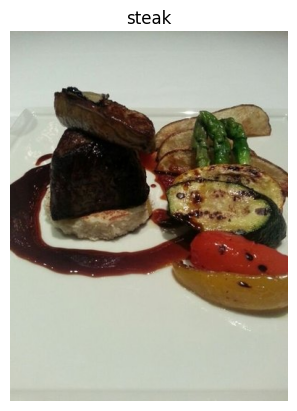

In [10]:
# View a random image from the training dataset
img_s = view_random_image(target_dir='pizza_steak/train/',
                        target_class='steak')

Image Shape: (512, 512, 3)


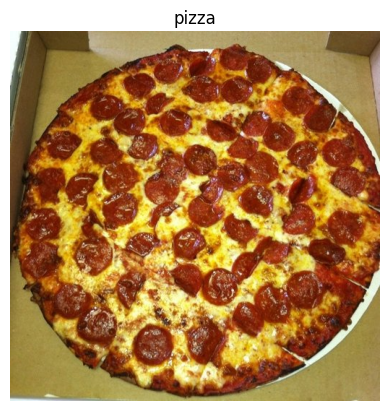

In [11]:
# View a random image from the training dataset
img_p = view_random_image(target_dir='pizza_steak/train/',
                        target_class='pizza')

In [12]:
# View the img (actually just a big array)
img_p

array([[[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [110,  83,  53],
        [112,  85,  55],
        [113,  86,  56]],

       [[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [108,  81,  51],
        [110,  83,  53],
        [111,  84,  54]],

       [[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [105,  78,  48],
        [106,  79,  49],
        [107,  80,  50]],

       ...,

       [[217, 228, 220],
        [216, 227, 219],
        [215, 226, 220],
        ...,
        [167, 143,  95],
        [167, 144,  94],
        [168, 145,  95]],

       [[227, 242, 239],
        [227, 242, 239],
        [226, 240, 240],
        ...,
        [169, 145,  97],
        [168, 145,  95],
        [169, 146,  96]],

       [[224, 240, 239],
        [224, 240, 239],
        [224, 240, 240],
        ...,
        [170, 146,  98],
        [169, 146,  96],
        [168, 145,  95]]

In [13]:
# Min and Max value possile of each pixel in image is 0 to 1
np.min(img_p),np.max(img_p)

(0, 255)

In [14]:
# Min and Max value possile of each pixel in image is 0 to 1
np.min(img_s),np.max(img_s)

(0, 255)

In [15]:
# View the img (actually just a big array) and find shape
img_p.shape

(512, 512, 3)

In [16]:
# View the img (actually just a big tensor)
tf.constant(img_p)

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [110,  83,  53],
        [112,  85,  55],
        [113,  86,  56]],

       [[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [108,  81,  51],
        [110,  83,  53],
        [111,  84,  54]],

       [[245, 254, 253],
        [245, 254, 253],
        [245, 254, 253],
        ...,
        [105,  78,  48],
        [106,  79,  49],
        [107,  80,  50]],

       ...,

       [[217, 228, 220],
        [216, 227, 219],
        [215, 226, 220],
        ...,
        [167, 143,  95],
        [167, 144,  94],
        [168, 145,  95]],

       [[227, 242, 239],
        [227, 242, 239],
        [226, 240, 240],
        ...,
        [169, 145,  97],
        [168, 145,  95],
        [169, 146,  96]],

       [[224, 240, 239],
        [224, 240, 239],
        [224, 240, 240],
        ...,
        [170, 146,  9

(-0.5, 511.5, 511.5, -0.5)

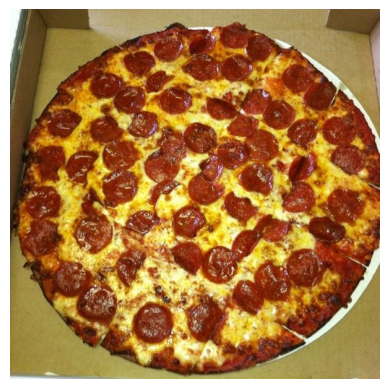

In [17]:
# Get all the pixel values between 0 & 1 or normalized image
plt.imshow(img_p/255)
plt.axis(False)

## **An end-to-end example**

let's build a convolutional neural network to find patterns in our images, more specifically we a need way to:

* Load our image 
* Preprocess our images
* Buils a CNN to find patterns in our images
* Fit the CNN to our training data


In [18]:
import tensorflow as tf

# Set random seed
tf.random.set_seed(42)

# Setup paths to our data directories
train_dir ="pizza_steak/train"
test_dir = "pizza_steak/test"

# Import data from directories and trun in into batches train dataset.
train_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.2,
                                                         subset='training',
                                                         image_size=(224, 224), # convert all images to be 224 x 224
                                                         color_mode="rgb",  # type of problem we're working on
                                                         batch_size=32, # number of images to process at a time 
                                                         labels='inferred',
                                                         label_mode='binary',
                                                         seed=42,shuffle=True)

valid_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.2,
                                                         subset='validation',
                                                         image_size=(224,224),  # convert all images to be 224 x 224
                                                         color_mode="rgb", # type of problem we're working on
                                                         batch_size=32,  # number of images to process at a time 
                                                         labels='inferred',
                                                         label_mode='binary',
                                                         seed=42,shuffle=True)  

# Normalization of images
normalization_layer = tf.keras.layers.Rescaling(1./255)

# Normalization of Train Data
normalized_train_data = train_data.map(lambda x, y: (normalization_layer(x), y))

# Normalization of Test Data
normalized_valid_data = valid_data.map(lambda x, y: (normalization_layer(x), y))


# Create a CNN model
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation='relu',
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding= 'valid'),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

# Compile our CNN.
model_1.compile(loss=tf.keras.losses.binary_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# Fit the model
history_1 = model_1.fit(normalized_train_data,
                        epochs=10,
                        steps_per_epoch=len(normalized_train_data),
                        validation_data=normalized_valid_data,
                        validation_steps=len(normalized_valid_data)) 


Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Epoch 1/10
38/38 [==============================] - 27s 453ms/step - loss: 0.6454 - accuracy: 0.6283 - val_loss: 0.5382 - val_accuracy: 0.7567
Epoch 2/10
38/38 [==============================] - 13s 329ms/step - loss: 0.4647 - accuracy: 0.7950 - val_loss: 0.4384 - val_accuracy: 0.8000
Epoch 3/10
38/38 [==============================] - 14s 329ms/step - loss: 0.4151 - accuracy: 0.8242 - val_loss: 0.4343 - val_accuracy: 0.8100
Epoch 4/10
38/38 [==============================] - 15s 344ms/step - loss: 0.3744 - accuracy: 0.8450 - val_loss: 0.4150 - val_accuracy: 0.8133
Epoch 5/10
38/38 [==============================] - 15s 351ms/step - loss: 0.3167 - accuracy: 0.8767 - val_loss: 0.4350 - val_accuracy: 0.8033
Epoch 6/10
38/38 [==============================] - 10s 222ms/step - loss: 0.2748 - accuracy: 0.8958 - val_loss: 0.4544 - val_accuracy: 0.82

In [19]:
pd.DataFrame(history_1.history)

,loss,accuracy,val_loss,val_accuracy
0,0.645395,0.628333,0.538227,0.756667
1,0.464729,0.795000,0.438434,0.800000
2,0.415075,0.824167,0.434284,0.810000
3,0.374393,0.845000,0.414978,0.813333
4,0.316682,0.876667,0.434952,0.803333
5,0.274753,0.895833,0.454420,0.820000
6,0.234400,0.919167,0.486431,0.793333
7,0.206294,0.924167,0.611028,0.760000
8,0.125273,0.957500,0.533689,0.806667
9,0.091731,0.973333,0.682181,0.746667


In [20]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

## **Ussing Same model as before**

Let's replicate the model we have built in a previous section to see if it works with our image data.

The model we are bulilding is form the TensorFlow playground:
 

In [21]:
# let's build normal model

# Set random seed
tf.random.set_seed(42)

# Create a model
model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(8,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(8,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

# Compile the model
model_2.compile(loss=tf.keras.losses.binary_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics = ['accuracy'])

# Fit the model
history_2 = model_2.fit(normalized_train_data,
                        epochs=10,
                        steps_per_epoch=len(normalized_train_data),
                        validation_data=normalized_valid_data,
                        validation_steps=len(normalized_valid_data))

Epoch 1/10
38/38 [==============================] - 2s 47ms/step - loss: 1.6699 - accuracy: 0.4725 - val_loss: 0.6926 - val_accuracy: 0.5367
Epoch 2/10
38/38 [==============================] - 2s 47ms/step - loss: 0.6933 - accuracy: 0.4908 - val_loss: 0.6929 - val_accuracy: 0.5367
Epoch 3/10
38/38 [==============================] - 2s 48ms/step - loss: 0.6932 - accuracy: 0.4892 - val_loss: 0.6932 - val_accuracy: 0.4633
Epoch 4/10
38/38 [==============================] - 2s 49ms/step - loss: 0.6931 - accuracy: 0.5092 - val_loss: 0.6933 - val_accuracy: 0.4633
Epoch 5/10
38/38 [==============================] - 2s 46ms/step - loss: 0.6931 - accuracy: 0.5092 - val_loss: 0.6933 - val_accuracy: 0.4633
Epoch 6/10
38/38 [==============================] - 2s 46ms/step - loss: 0.6931 - accuracy: 0.5092 - val_loss: 0.6935 - val_accuracy: 0.4633
Epoch 7/10
38/38 [==============================] - 2s 46ms/step - loss: 0.6931 - accuracy: 0.5092 - val_loss: 0.6936 - val_accuracy: 0.4633
Epoch 8/10
38

In [22]:
pd.DataFrame(history_2.history)

,loss,accuracy,val_loss,val_accuracy
0,1.669862,0.472500,0.692640,0.536667
1,0.693282,0.490833,0.692867,0.536667
2,0.693192,0.489167,0.693180,0.463333
3,0.693146,0.509167,0.693279,0.463333
4,0.693125,0.509167,0.693329,0.463333
5,0.693105,0.509167,0.693498,0.463333
6,0.693079,0.509167,0.693608,0.463333
7,0.693082,0.509167,0.693656,0.463333
8,0.693051,0.509167,0.693761,0.463333
9,0.693074,0.509167,0.693855,0.463333


In [23]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 8)                 1204232   
                                                                 
 dense_2 (Dense)             (None, 8)                 72        
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 1,204,313
Trainable params: 1,204,313
Non-trainable params: 0
_________________________________________________________________


Despite having 20x more parameters than our CNN (model_1), model_2 performs terribly.. let's try to improve it.

## **Binary Classification: Let's break it down**

1. Become one with the data (visualize,visualize,visualize)
2. Preprocess the data(Prepapred it for our model, the main step here was scaling/normalizing)
3. Create a model
4. Fit the model
5. Evalute the model
6. Adjust different parameters and improve the model (try to beat our baseline)
7. Repeat until satisfied(experiment,experiment,experiment)

### **1. Become One with the Data**

Image Shape: (384, 512, 3)
Image Shape: (512, 512, 3)


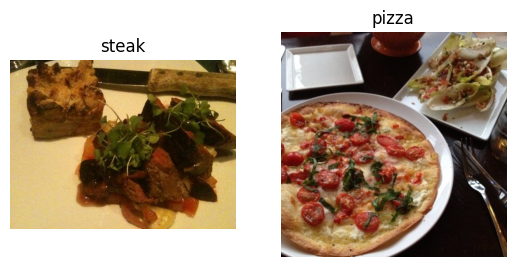

In [24]:
# Visualize Data
plt.figure()
plt.subplot(1,2,1)
steak_img = view_random_image('pizza_steak/train/','steak')
plt.subplot(1,2,2)
pizza_img = view_random_image('pizza_steak/train/','pizza')

### **2. Preprocess the Data**

Our next step is to turn our data into **batches**.

A batch is a small subset of data. Rather than look at all ~10,000 images at one time, a model might only llok at 32 at a time.

It does this for a couple of reasons:
1. 10,000 images(or more) might not fit into the memory of your processor(GPU).
2. Trying to learn the patterns in 10,000 images in one hit could result in the model not being able to learn very well.

why 32?

Because 32 is good for your health....

[how to load images in TensorFlow](https://www.tensorflow.org/tutorials/load_data/images)

**Image resize (224,224) pixel (H,W)**

In [25]:

# Import data from directories and trun in into batches train dataset.
train_data0 = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.1,
                                                         subset='training',
                                                         image_size=(224, 224), # convert all images to be 224 x 224
                                                         color_mode="grayscale",  # type of problem we're working on
                                                         batch_size=32, # number of images to process at a time
                                                         seed=42,shuffle=True)

valid_data0 = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.1,
                                                         subset='validation',
                                                         image_size=(224,224),  # convert all images to be 224 x 224
                                                         color_mode="rgb", # type of problem we're working on
                                                         batch_size=32,  # number of images to process at a time 
                                                         labels='inferred',
                                                         label_mode='binary',
                                                         seed=42,shuffle=True)  

Found 1500 files belonging to 2 classes.
Using 1350 files for training.
Found 1500 files belonging to 2 classes.
Using 150 files for validation.


In [26]:
class_names = train_data0.class_names
print(class_names)

['pizza', 'steak']


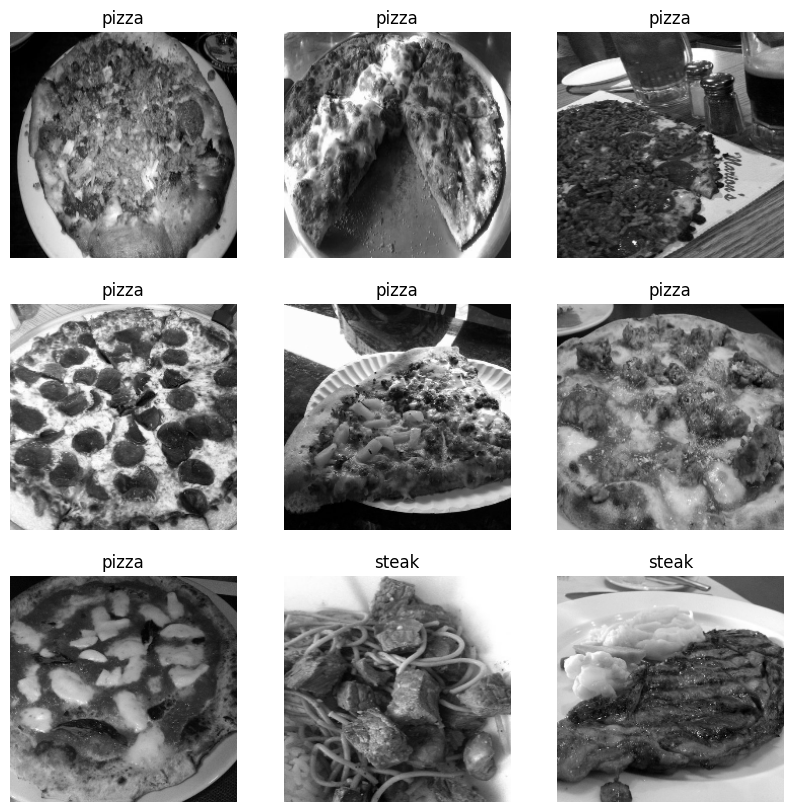

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_data0.take(1):
      for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(tf.squeeze(images[i].numpy().astype("uint8")),cmap='gray')
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [28]:
class_names = valid_data0.class_names
print(class_names)

['pizza', 'steak']


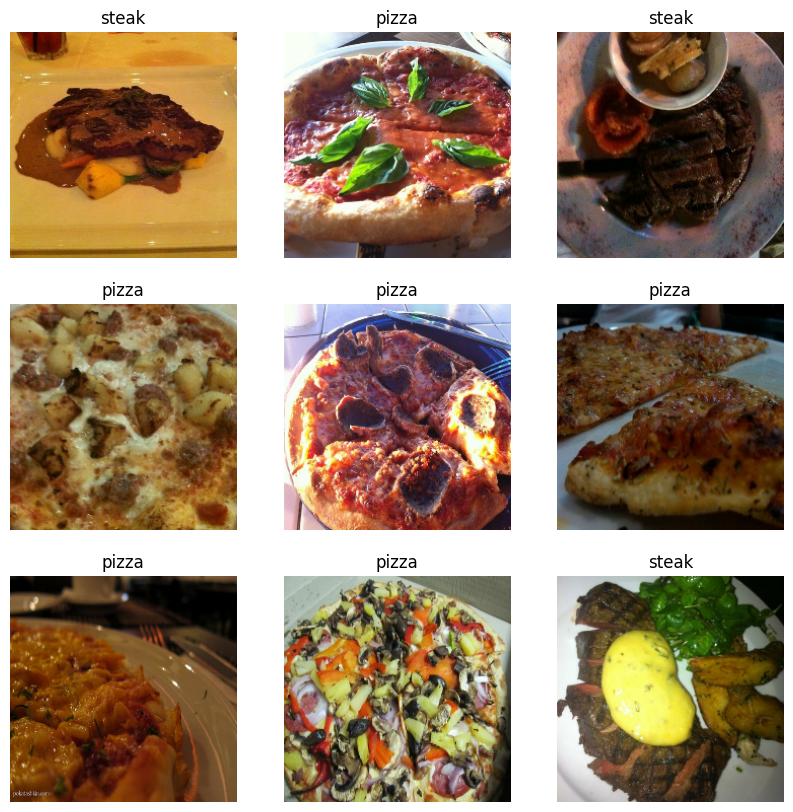

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in valid_data0.take(1):
      for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[int(labels[i].numpy())])
        plt.axis("off")
        #int(tf.squeeze(labels[i].numpy()).numpy())

In [30]:
# Define directory dataset paths
train_dir0 = 'pizza_steak/train/'
test_dir0 = 'pizza_steak/test/'

# Create train and test data  generators and rescale the data
train_data1 = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=.20,
                                                          subset='training',
                                                          labels='inferred',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

valid_data1 = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=0.20,
                                                          subset='validation',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)


Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Found 500 files belonging to 2 classes.


In [31]:
# How many batches are there
len(train_data1)

38

In [32]:
38*32

1216

In [33]:
1200/32

37.5

In [34]:
# To check The size of batch
for image_batch,labels_batch in train_data1:
    print(image_batch.shape)
    print(labels_batch.shape)
    break


(32, 224, 224, 3)
(32, 1)


In [35]:
# list of vowels
phones = ['apple', 'samsung', 'oneplus']
phones_iter = iter(phones)

# iter() function example
print(next(phones_iter))   
print(next(phones_iter))    
print(next(phones_iter))    

apple
samsung
oneplus


**Normalization of Image**

In [36]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

normalized_train_ds = train_data1.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_train_ds))
first_image = image_batch[0]
class_name = class_names[int(labels_batch[0].numpy())]

# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

normalized_vail_ds = valid_data1.map(lambda x, y: (normalization_layer(x), y))
image_batch0, labels_batch0 = next(iter(normalized_vail_ds))
first_image0 = image_batch0[0]
class_name0 = class_names[int(labels_batch0[0].numpy())]

# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image0), np.max(first_image0))

0.047959354 1.0
0.0 1.0


In [37]:
int(labels_batch[0].numpy())

0

In [38]:
first_image.numpy().shape,first_image.numpy().dtype

((224, 224, 3), dtype('float32'))

pizza
(224, 224, 3)


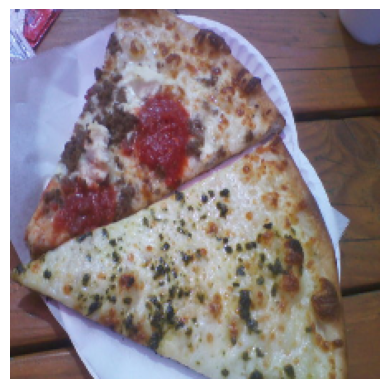

In [39]:
plt.imshow(first_image.numpy())
print(class_name)
plt.axis(False)
print(first_image.numpy().shape);

pizza
(224, 224, 3)


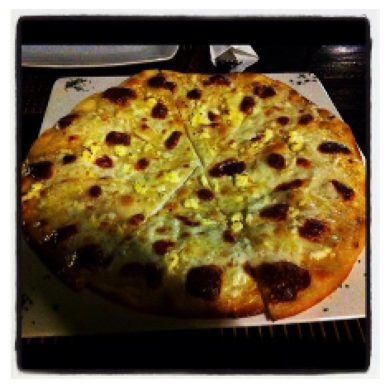

In [40]:
plt.imshow(first_image0.numpy())
print(class_name0)
plt.axis(False)
print(first_image0.numpy().shape);

**Normalization of Image Practice**

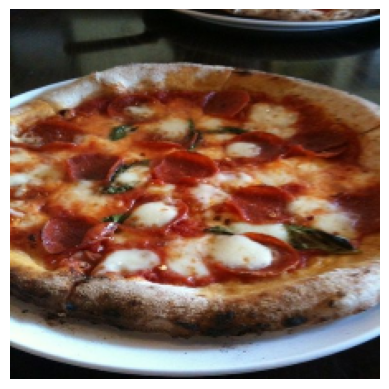

In [41]:
normal_layer = tf.keras.layers.Rescaling(1./255)

normal_train_data = train_data.map(lambda x,y:(normal_layer(x),y))
img_batch,label_batch = next(iter(normal_train_data))
plt.imshow(img_batch[3])
plt.axis(False);


### **3. Create a CNN model (start with a baseline)**

A baseline is a relatively simple model or existing result that you setup when beginning a machine learning experiment and then as you keep experimenting,you try to beat the baseline.

In [42]:
# Make the creating of our model a littel easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [43]:
# Create the model (This will be our baseline, a layer convolutional neural network)
model_4 = Sequential([
    Conv2D(filters=10, # Filter is the number of sliding windows going across an input (higher = more complex model)
           kernel_size=3,# The size of the sliding window going across an input window
           strides=1,# Size of the step of the sliding window takes across an input
           padding='valid',# if 'same', output shape is same as input shape, if 'valid',output shape gets compressed.
           activation='relu',
           input_shape=(224,224,3)), # Input layer (specify input shape)
    Conv2D(10,3,activation='relu'),
    Conv2D(10,3,activation='relu'),
    Flatten(),
    Dense(1,activation='sigmoid') # Output layer(working with binary classification so only 1 output layer)
])

In [44]:
# Compile model
model_4.compile(loss= tf.keras.losses.binary_crossentropy,
                optimizer= tf.keras.optimizers.Adam(),
                metrics =['accuracy'])

In [45]:
# summary of model
model_4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_2 (Flatten)         (None, 475240)            0         
                                                                 
 dense_4 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [46]:
# Check the lengths of training and test data generators
len(normalized_train_data),len(normalized_valid_data)

(38, 10)

In [47]:
# Fit the model
history_4 = model_4.fit(normalized_train_data,
                        epochs=5,
                        steps_per_epoch=len(normalized_train_data),
                        validation_data=normalized_valid_data,
                        validation_steps=len(normalized_valid_data))

Epoch 1/5
38/38 [==============================] - 17s 402ms/step - loss: 0.7045 - accuracy: 0.6658 - val_loss: 0.4441 - val_accuracy: 0.8033
Epoch 2/5
38/38 [==============================] - 15s 387ms/step - loss: 0.4014 - accuracy: 0.8292 - val_loss: 0.4439 - val_accuracy: 0.7900
Epoch 3/5
38/38 [==============================] - 10s 263ms/step - loss: 0.3080 - accuracy: 0.8800 - val_loss: 0.4669 - val_accuracy: 0.7900
Epoch 4/5
38/38 [==============================] - 11s 270ms/step - loss: 0.1656 - accuracy: 0.9600 - val_loss: 0.5523 - val_accuracy: 0.7433
Epoch 5/5
38/38 [==============================] - 11s 274ms/step - loss: 0.0840 - accuracy: 0.9783 - val_loss: 0.9139 - val_accuracy: 0.7133


In [48]:
pd.DataFrame(history_4.history)

,loss,accuracy,val_loss,val_accuracy
0,0.704541,0.665833,0.444069,0.803333
1,0.401425,0.829167,0.443905,0.790000
2,0.308040,0.880000,0.466901,0.790000
3,0.165591,0.960000,0.552286,0.743333
4,0.083990,0.978333,0.913885,0.713333


<AxesSubplot: xlabel='epochs'>

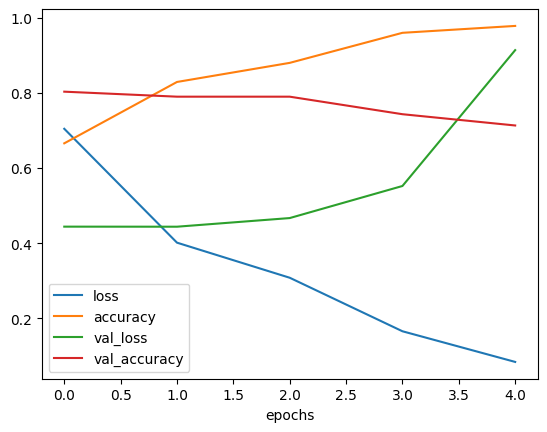

In [49]:
# Lets Check loss and accuracy 
pd.DataFrame(history_4.history).plot(xlabel='epochs')

In [50]:
def plot_loss_curve(history):
    """
    Returns separate loss curves for training and validation etrics.
    """
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epoch = range(len(history.history['loss'])) # No of epochs 

    # Plot loss graph
    plt.plot(epoch,loss,label='Traing data')
    plt.plot(epoch,val_loss,label='Validation data')
    plt.title('Loss Function')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy graph
    plt.figure()
    plt.plot(epoch,accuracy,label='Training data')
    plt.plot(epoch,val_accuracy,label='Validation data'),
    plt.title('Accuracy Function')
    plt.xlabel('Epochs')
    plt.legend()

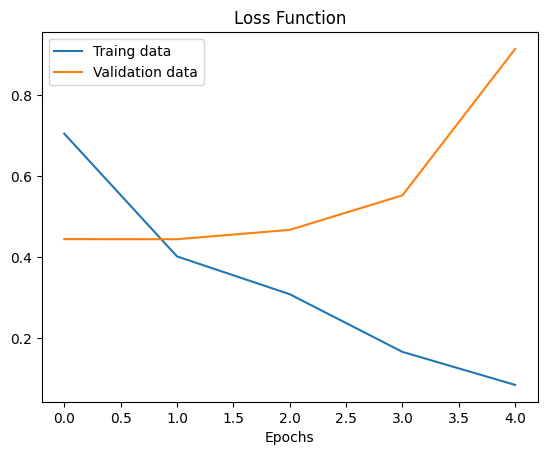

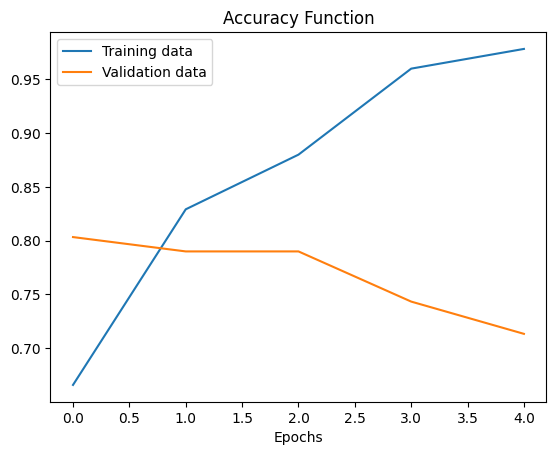

In [51]:
plot_loss_curve(history_4)

**Overfite the data**

### 6. Adjust the model parameters

Fitting a machine lerning model comes in 3 steps:

0. Create a baseline
1. Beat the baseline by overfitting a larger model
2. Reduce overfitting

Ways to induce overfitting

* Increase the number of conv layers
* Increase the number of conv filters
* Add another dense layer to the output of our flattened LAYER

Reduce Overfitting

* Add data augmentation
* Add regularization layers(such as MaxPool2D)
* Add more data........


**Note:** Reducing overfitting is also known as **regularization**

* **Add regularization layers(such as MaxPool2D)**

In [52]:
# Create the model (this is going to be our new baseline)
model_5 = Sequential([
    Conv2D(10,3,activation='relu',input_shape=(224,224,3)),
    MaxPool2D(pool_size=2),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1,activation='sigmoid')
])

In [53]:
# Compile the model
model_5.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [54]:
history_5 = model_5.fit(normalized_train_data,
                        epochs=5,
                        steps_per_epoch=len(normalized_train_data),
                        validation_data=normalized_valid_data,
                        validation_steps=len(normalized_valid_data))

Epoch 1/5
38/38 [==============================] - 6s 127ms/step - loss: 0.6808 - accuracy: 0.5958 - val_loss: 0.5817 - val_accuracy: 0.7167
Epoch 2/5
38/38 [==============================] - 5s 112ms/step - loss: 0.5334 - accuracy: 0.7483 - val_loss: 0.5081 - val_accuracy: 0.7600
Epoch 3/5
38/38 [==============================] - 4s 111ms/step - loss: 0.4818 - accuracy: 0.7842 - val_loss: 0.4884 - val_accuracy: 0.7667
Epoch 4/5
38/38 [==============================] - 4s 109ms/step - loss: 0.4470 - accuracy: 0.8050 - val_loss: 0.4550 - val_accuracy: 0.8067
Epoch 5/5
38/38 [==============================] - 5s 113ms/step - loss: 0.4134 - accuracy: 0.8225 - val_loss: 0.4797 - val_accuracy: 0.7700


In [55]:
pd.DataFrame(history_5.history)

,loss,accuracy,val_loss,val_accuracy
0,0.680750,0.595833,0.581718,0.716667
1,0.533390,0.748333,0.508070,0.760000
2,0.481782,0.784167,0.488362,0.766667
3,0.446992,0.805000,0.455034,0.806667
4,0.413376,0.822500,0.479669,0.770000


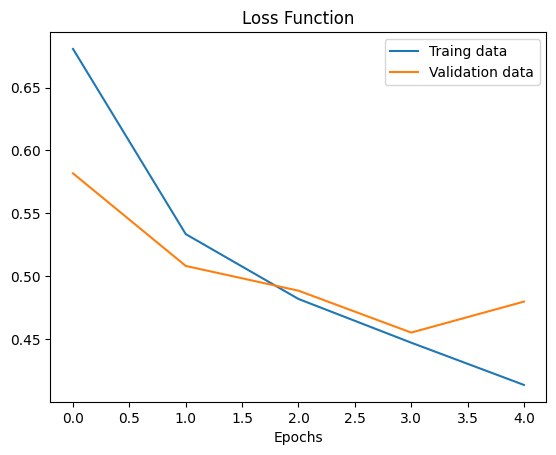

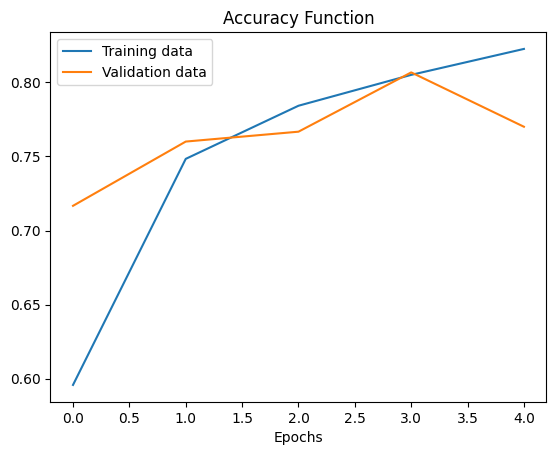

In [56]:
plot_loss_curve(history_5)

In [57]:
# Get summary of our model wit MaxPool
model_5.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 10)      

#### **Data Augmentation**
* `tf.keras.layers.RandomFlip`
* `tf.keras.layers.RandomRotation`
* `tf.keras.layers.RandomContrast`
* `tf.keras.layers.RandomCrop`
* `tf.keras.layers.RandomZoom`

In [58]:
# Data augmentation layers
data_augmentation_rot_flip = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(mode='horizontal_and_vertical'),
    tf.keras.layers.RandomRotation(factor=(-.20,.80),
                                  fill_mode="constant",
                                  fill_value=100,
                                  interpolation="nearest")
]) 

Image Shape: (512, 512, 3)


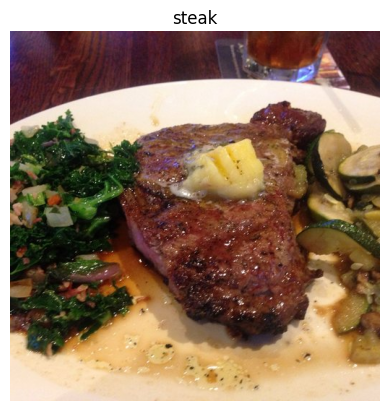

In [59]:
img = view_random_image('pizza_steak/train/','steak')
plt.imshow(img);

(512, 512, 3)


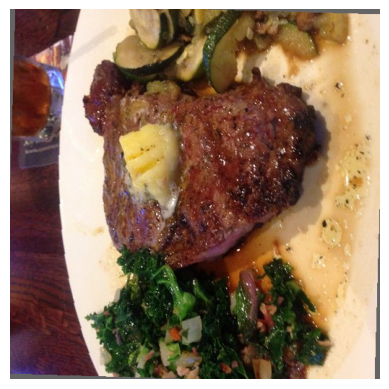

In [60]:
img_rotate_flip=data_augmentation_rot_flip(img)
plt.imshow(img_rotate_flip.numpy().astype('uint8'))
plt.axis(False)
print(img_rotate_flip.shape,)

(512, 512, 3)


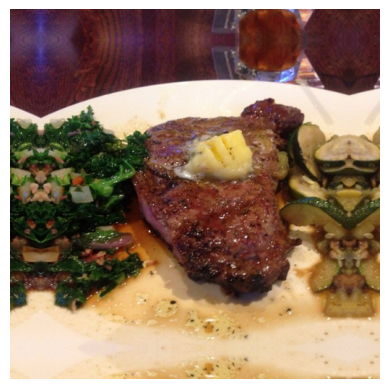

In [61]:
# Crop random crop
data_augmentation_zoom = tf.keras.layers.RandomZoom(
    height_factor=(0.2,.8),
    fill_mode='reflect',
    interpolation='bilinear',
    fill_value=0.0,
)

image_zoom = data_augmentation_zoom(img)
plt.imshow(image_zoom.numpy().astype('uint8'))
plt.axis(False)
print(image_zoom.numpy().shape)

(512, 512, 3)


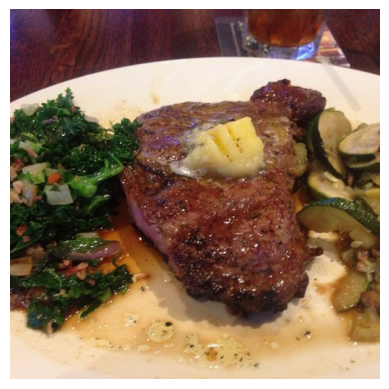

In [62]:
# Crop random crop
data_augmentation_contrast = tf.keras.layers.RandomContrast(
    factor=(0.2,.50)
)
image_contrast = data_augmentation_contrast(img)
plt.imshow(image_contrast.numpy().astype('uint8'))
plt.axis(False)
print(image_contrast.numpy().shape)

In [63]:
# Building the the Final test model

# Set random seed
tf.random.set_seed(42)

# defining directory path
train_dir= 'pizza_steak/train/'
test_dir= 'pizza_steak/test/'

# Create train and test data  generators and rescale the data
train_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=.20,
                                                          subset='training',
                                                          labels='inferred',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

valid_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=0.20,
                                                          subset='validation',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)

# Create model
converter = tf.keras.Sequential([
    
    # Creating Augmented image
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.RandomFlip(mode='horizontal_and_vertical',
                               seed=42),
    tf.keras.layers.RandomRotation(factor =(0.2,0.9),
                                  fill_mode ='nearest',
                                  interpolation ='bilinear',
                                  seed=42),
    tf.keras.layers.RandomCrop(224,224,
                               seed= 42),
    tf.keras.layers.RandomContrast(factor= (0,255),
                                  seed=42),
    tf.keras.layers.RandomZoom(height_factor=(0.2,.8),
                               fill_mode='reflect',
                               interpolation='bilinear',
                               seed=42)

])


augmented_train_data = train_data.map(lambda x,y :(converter(x),y))
augmented_valid_data = valid_data.map(lambda x,y :(converter(x),y))
augmented_test_data = test_data.map(lambda x,y :(converter(x),y))
    
model_6= tf.keras.Sequential([
    

    # Creating model layers
    tf.keras.layers.Conv2D(filters= 10,
                           kernel_size= (3,3),
                           strides= (1,1),
                           padding='valid',
                           activation = tf.keras.activations.relu,
                           input_shape=(224,224,3),
                          ),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10,3,padding='valid',
                           activation= tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(10,3,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation= tf.keras.activations.sigmoid),

])

# Compile model
model_6.compile(loss= tf.keras.losses.binary_crossentropy,
                optimizer= tf.keras.optimizers.Adam(),
                metrics= ['accuracy']
               )



Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Found 500 files belonging to 2 classes.


In [64]:
# Fit the model
history_6 = model_6.fit(augmented_train_data,
                        epochs=10,
                        steps_per_epoch= len(augmented_train_data),
                        validation_data= augmented_valid_data,
                        validation_steps= len(augmented_valid_data)
                       )

Epoch 1/10
38/38 [==============================] - 32s 833ms/step - loss: 0.9705 - accuracy: 0.5667 - val_loss: 0.6745 - val_accuracy: 0.6433
Epoch 2/10
38/38 [==============================] - 31s 819ms/step - loss: 0.6251 - accuracy: 0.6767 - val_loss: 0.6064 - val_accuracy: 0.7000
Epoch 3/10
38/38 [==============================] - 30s 789ms/step - loss: 0.5456 - accuracy: 0.7625 - val_loss: 0.5356 - val_accuracy: 0.7467
Epoch 4/10
38/38 [==============================] - 30s 787ms/step - loss: 0.4933 - accuracy: 0.7717 - val_loss: 0.5129 - val_accuracy: 0.8167
Epoch 5/10
38/38 [==============================] - 29s 766ms/step - loss: 0.4626 - accuracy: 0.8075 - val_loss: 0.4833 - val_accuracy: 0.7467
Epoch 6/10
38/38 [==============================] - 31s 814ms/step - loss: 0.4712 - accuracy: 0.8000 - val_loss: 0.4760 - val_accuracy: 0.8300
Epoch 7/10
38/38 [==============================] - 31s 813ms/step - loss: 0.4599 - accuracy: 0.8108 - val_loss: 0.5002 - val_accuracy: 0.8000

In [65]:
pd.DataFrame(history_6.history)

,loss,accuracy,val_loss,val_accuracy
0,0.970505,0.566667,0.674480,0.643333
1,0.625143,0.676667,0.606371,0.700000
2,0.545644,0.762500,0.535637,0.746667
3,0.493285,0.771667,0.512938,0.816667
4,0.462647,0.807500,0.483321,0.746667
5,0.471204,0.800000,0.476049,0.830000
6,0.459905,0.810833,0.500244,0.800000
7,0.424400,0.834167,0.416433,0.840000
8,0.403575,0.850000,0.528644,0.773333
9,0.422674,0.830000,0.455869,0.833333


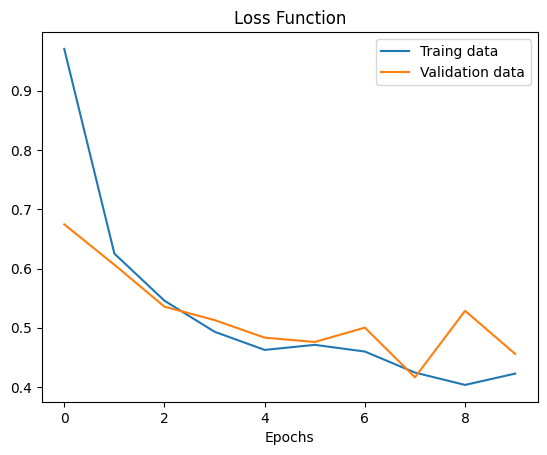

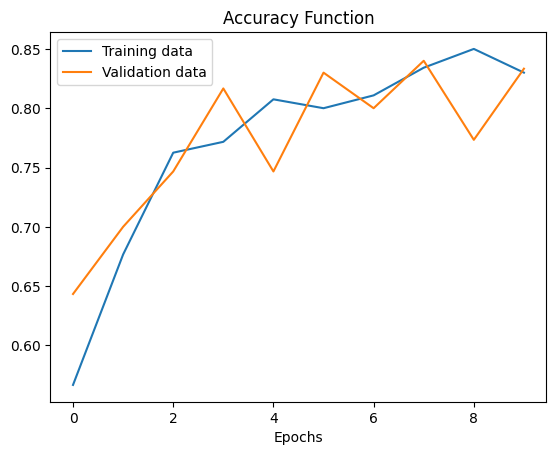

In [66]:
plot_loss_curve(history_6)

In [67]:
# Building the the Final test model

# Set random seed
tf.random.set_seed(42)

# defining directory path
train_dir= 'pizza_steak/train/'
test_dir= 'pizza_steak/test/'

# Create train and test data  generators and rescale the data
train_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=.20,
                                                          subset='training',
                                                          labels='inferred',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

valid_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=0.20,
                                                          subset='validation',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)

# Create model
converter = tf.keras.Sequential([
    
    # Creating Augmented image
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.RandomFlip(mode='horizontal_and_vertical',
                               seed=42),
    tf.keras.layers.RandomRotation(factor =(0.2,0.8),
                                  fill_mode ='nearest',
                                  interpolation ='bilinear',
                                  seed=42),
    tf.keras.layers.RandomContrast(factor= (0,255),
                                  seed=42),
    tf.keras.layers.RandomZoom(height_factor=(0.2,.8),
                               fill_mode='reflect',
                               interpolation='bilinear',
                               fill_value=0.0,
                               seed=42
                              )

   
])

model_7= tf.keras.Sequential([
    converter,
    # Creating model layers
    tf.keras.layers.Conv2D(filters= 32,
                           kernel_size= (2,2),
                           strides= (1,1),
                           padding='valid',
                           activation = tf.keras.activations.relu,
                           input_shape=(224,224,3),
                          ),
    tf.keras.layers.MaxPool2D(pool_size=5),
    tf.keras.layers.Conv2D(32,2,padding='valid',
                           activation= tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(32,2,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(32,2,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.Conv2D(32,2,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.Conv2D(32,2,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100,activation= tf.keras.activations.relu),
    tf.keras.layers.Dense(80,activation= tf.keras.activations.relu),
    tf.keras.layers.Dense(1,activation= tf.keras.activations.sigmoid),

])

# Compile model
model_7.compile(loss= tf.keras.losses.binary_crossentropy,
                optimizer= tf.keras.optimizers.Adam(),
                metrics= ['accuracy']
               )



Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Found 500 files belonging to 2 classes.


In [68]:
# Fit the model
history_7 = model_7.fit(train_data,
                        epochs=10,
                        steps_per_epoch= len(train_data),
                        validation_data= valid_data,
                        validation_steps= len(valid_data)
                       )

Epoch 1/10


38/38 [==============================] - 41s 791ms/step - loss: 0.6688 - accuracy: 0.6633 - val_loss: 0.6890 - val_accuracy: 0.5500
Epoch 2/10
38/38 [==============================] - 30s 775ms/step - loss: 0.5825 - accuracy: 0.7417 - val_loss: 0.6879 - val_accuracy: 0.7467
Epoch 3/10
38/38 [==============================] - 30s 770ms/step - loss: 0.5211 - accuracy: 0.7858 - val_loss: 0.6895 - val_accuracy: 0.4600
Epoch 4/10
38/38 [==============================] - 28s 725ms/step - loss: 0.4625 - accuracy: 0.8200 - val_loss: 0.7162 - val_accuracy: 0.4600
Epoch 5/10
38/38 [==============================] - 29s 767ms/step - loss: 0.4611 - accuracy: 0.8100 - val_loss: 0.6809 - val_accuracy: 0.4767
Epoch 6/10
38/38 [==============================] - 29s 763ms/step - loss: 0.4174 - accuracy: 0.8375 - val_loss: 0.6544 - val_accuracy: 0.6267
Epoch 7/10
38/38 [==============================] - 30s 775ms/step - loss: 0.4367 - accuracy: 0.8275 - val_loss: 0.6486 - val_accuracy: 0.5667
Epoch 8/10

In [69]:
pd.DataFrame(history_7.history)

,loss,accuracy,val_loss,val_accuracy
0,0.668830,0.663333,0.688984,0.550000
1,0.582513,0.741667,0.687911,0.746667
2,0.521112,0.785833,0.689454,0.460000
3,0.462493,0.820000,0.716167,0.460000
4,0.461135,0.810000,0.680893,0.476667
5,0.417415,0.837500,0.654424,0.626667
6,0.436660,0.827500,0.648567,0.566667
7,0.441319,0.823333,0.693394,0.460000
8,0.399184,0.830833,0.682390,0.493333
9,0.383764,0.854167,0.588751,0.766667


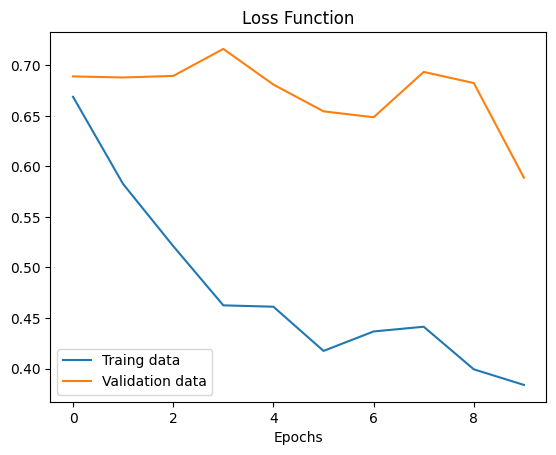

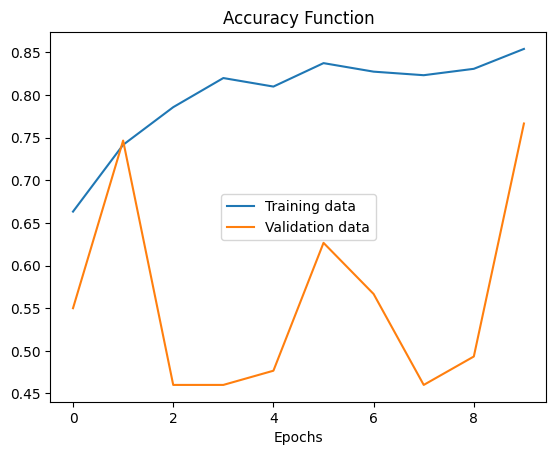

In [70]:
plot_loss_curve(history_7)

In [71]:
model_7.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_7 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 223, 223, 32)      416       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 44, 44, 32)       0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 43, 43, 32)        4128      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 21, 21, 32)       0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 20, 20, 32)       

In [72]:
model_7.evaluate(test_data)

16/16 [==============================] - 2s 78ms/step - loss: 0.5692 - accuracy: 0.8080


[0.5692293047904968, 0.8080000281333923]

In [73]:
model_6.evaluate(augmented_test_data)

16/16 [==============================] - 14s 652ms/step - loss: 0.3473 - accuracy: 0.8420


[0.3472505509853363, 0.8420000076293945]

In [74]:
model_5.evaluate(normal_train_data)

38/38 [==============================] - 2s 43ms/step - loss: 0.4006 - accuracy: 0.8258


[0.40061938762664795, 0.8258333206176758]

In [75]:
import tensorflow as tf

# Set random seed
tf.random.set_seed(42)

# Setup paths to our data directories
train_dir ="pizza_steak/train"
test_dir = "pizza_steak/test"

# Import data from directories and trun in into batches train dataset.
train_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.2,
                                                         subset='training',
                                                         image_size=(224, 224), # convert all images to be 224 x 224
                                                         color_mode="rgb",  # type of problem we're working on
                                                         batch_size=32, # number of images to process at a time 
                                                         labels='inferred',
                                                         label_mode='binary',
                                                         seed=42,shuffle=True)

valid_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                         validation_split=0.2,
                                                         subset='validation',
                                                         image_size=(224,224),  # convert all images to be 224 x 224
                                                         color_mode="rgb", # type of problem we're working on
                                                         batch_size=32,  # number of images to process at a time 
                                                         labels='inferred',
                                                         label_mode='binary',
                                                         seed=42,shuffle=True)  

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)


# Normalization of images
normalization_layer = tf.keras.layers.Rescaling(1./255)



# Create a CNN model
model_8 = tf.keras.models.Sequential([
    normalization_layer,
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation='relu',
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding= 'valid'),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

# Compile our CNN.
model_8.compile(loss=tf.keras.losses.binary_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# Fit the model
history_8 = model_8.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data)) 


Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Found 500 files belonging to 2 classes.
Epoch 1/10
38/38 [==============================] - 10s 239ms/step - loss: 0.6766 - accuracy: 0.5908 - val_loss: 0.5663 - val_accuracy: 0.7600
Epoch 2/10
38/38 [==============================] - 10s 247ms/step - loss: 0.4685 - accuracy: 0.7933 - val_loss: 0.4398 - val_accuracy: 0.8100
Epoch 3/10
38/38 [==============================] - 10s 251ms/step - loss: 0.4187 - accuracy: 0.8183 - val_loss: 0.4724 - val_accuracy: 0.7833
Epoch 4/10
38/38 [==============================] - 10s 253ms/step - loss: 0.3943 - accuracy: 0.8350 - val_loss: 0.4270 - val_accuracy: 0.7933
Epoch 5/10
38/38 [==============================] - 10s 252ms/step - loss: 0.3720 - accuracy: 0.8458 - val_loss: 0.4489 - val_accuracy: 0.7800
Epoch 6/10
38/38 [==============================] - 10s 257ms/step - loss: 0.3484 - accuracy: 0.8592

In [76]:
pd.DataFrame(history_8.history)

,loss,accuracy,val_loss,val_accuracy
0,0.676643,0.590833,0.566314,0.760000
1,0.468539,0.793333,0.439779,0.810000
2,0.418685,0.818333,0.472370,0.783333
3,0.394255,0.835000,0.426992,0.793333
4,0.372044,0.845833,0.448947,0.780000
5,0.348371,0.859167,0.428916,0.786667
6,0.323050,0.858333,0.465016,0.793333
7,0.269340,0.897500,0.423306,0.796667
8,0.218737,0.917500,0.433481,0.800000
9,0.169116,0.946667,0.486313,0.803333


In [77]:
model_8.evaluate(test_data)

16/16 [==============================] - 2s 133ms/step - loss: 0.4637 - accuracy: 0.8240


[0.46369296312332153, 0.8240000009536743]

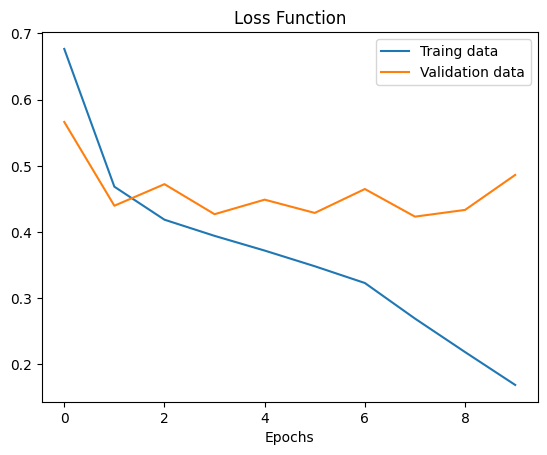

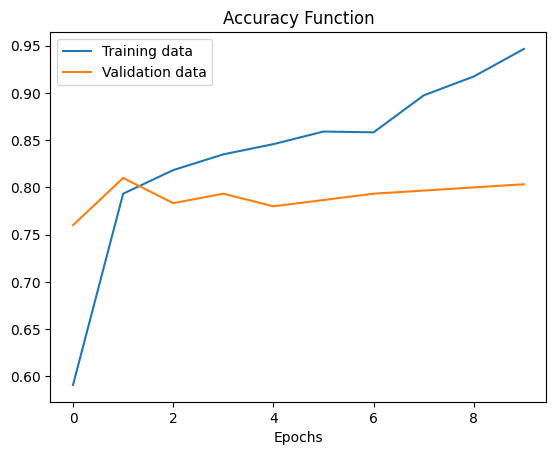

In [78]:
plot_loss_curve(history_8)

* **Final Model**

In [79]:

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)


# Normalization of images
normalization_layer = tf.keras.layers.Rescaling(1./255)

normal_test_data = test_data.map(lambda x,y:((normalization_layer(x)),y))

Found 500 files belonging to 2 classes.


In [80]:
model_6.evaluate(normal_test_data)

16/16 [==============================] - 1s 58ms/step - loss: 0.5914 - accuracy: 0.6680


[0.591431736946106, 0.6679999828338623]

In [81]:
model_6.evaluate(augmented_test_data)

16/16 [==============================] - 18s 799ms/step - loss: 0.3533 - accuracy: 0.8700


[0.35327091813087463, 0.8700000047683716]

### Final model

In [104]:
# Building the the Final test model

# Set random seed
tf.random.set_seed(42)

# defining directory path
train_dir= 'pizza_steak/train/'
test_dir= 'pizza_steak/test/'

# Create train and test data  generators and rescale the data
train_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=.20,
                                                          subset='training',
                                                          labels='inferred',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

valid_data = tf.keras.utils.image_dataset_from_directory(directory=train_dir0,
                                                          color_mode='rgb',
                                                          batch_size=32,
                                                          image_size=(224,224),
                                                          validation_split=0.20,
                                                          subset='validation',
                                                          label_mode='binary',
                                                          seed=101,shuffle=True)

test_data = tf.keras.utils.image_dataset_from_directory(directory=test_dir0,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        labels='inferred',
                                                        label_mode='binary',
                                                        image_size=(224,224),
                                                        seed=101,shuffle=True)

# Create model
converter = tf.keras.Sequential([
    
    # Creating Augmented image
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.RandomFlip(mode='horizontal_and_vertical',
                               seed=42),
    tf.keras.layers.RandomRotation(factor =(0.2,1.),
                                  fill_mode ='constant',
                                  interpolation ='bilinear',
                                  fill_value=0.0,  
                                  seed=42),
    tf.keras.layers.RandomCrop(224,224,
                               seed=42),
    tf.keras.layers.RandomContrast(factor= (0,255),
                                  seed=42),
    tf.keras.layers.RandomZoom(height_factor=(0.2,.5),
                               fill_mode='constant',
                               interpolation='bilinear',
                               fill_value=0.0,
                               seed=42)

])

def preparing_data(data):
    
    augmented_data = data.map(lambda x,y:(converter(x,training=True),y))
    
    return augmented_data

augmented_train_data = preparing_data(train_data)
augmented_valid_data = preparing_data(valid_data)
augmented_test_data =  preparing_data(test_data)



Found 1500 files belonging to 2 classes.
Using 1200 files for training.
Found 1500 files belonging to 2 classes.
Using 300 files for validation.
Found 500 files belonging to 2 classes.


In [108]:
    
final_model= tf.keras.Sequential([
    

    # Creating model layers
    tf.keras.layers.Conv2D(filters= 10,
                           kernel_size= (3,3),
                           strides= (1,1),
                           padding='valid',
                           activation = tf.keras.activations.relu,
                           input_shape=(224,224,3),
                          ),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10,3,padding='valid',
                           activation= tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(10,3,padding='valid',
                          activation = tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation= tf.keras.activations.sigmoid),

])

# Compile model
final_model.compile(loss= tf.keras.losses.binary_crossentropy,
                optimizer= tf.keras.optimizers.Adam(),
                metrics= ['accuracy']
               )

# Fit the model
final_history = final_model.fit(augmented_train_data,
                        epochs=10,
                        steps_per_epoch= len(augmented_train_data),
                        validation_data= augmented_valid_data,
                        validation_steps= len(augmented_valid_data)
                       )

Epoch 1/10
38/38 [==============================] - 41s 1s/step - loss: 1.0316 - accuracy: 0.6167 - val_loss: 0.5964 - val_accuracy: 0.6967
Epoch 2/10
38/38 [==============================] - 40s 1s/step - loss: 0.5960 - accuracy: 0.7025 - val_loss: 0.5686 - val_accuracy: 0.7733
Epoch 3/10
38/38 [==============================] - 37s 976ms/step - loss: 0.5457 - accuracy: 0.7542 - val_loss: 0.5246 - val_accuracy: 0.7900
Epoch 4/10
38/38 [==============================] - 39s 1s/step - loss: 0.5293 - accuracy: 0.7717 - val_loss: 0.4676 - val_accuracy: 0.8033
Epoch 5/10
38/38 [==============================] - 39s 1s/step - loss: 0.4879 - accuracy: 0.7950 - val_loss: 0.4959 - val_accuracy: 0.8133
Epoch 6/10
38/38 [==============================] - 39s 1s/step - loss: 0.4677 - accuracy: 0.8008 - val_loss: 0.4288 - val_accuracy: 0.8233
Epoch 7/10
38/38 [==============================] - 41s 1s/step - loss: 0.4534 - accuracy: 0.8200 - val_loss: 0.4336 - val_accuracy: 0.8267
Epoch 8/10
38/38 

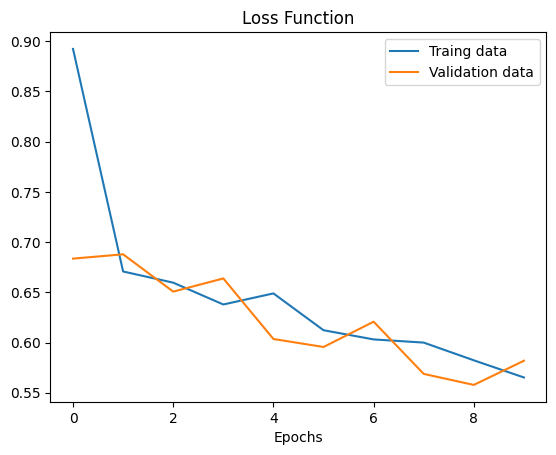

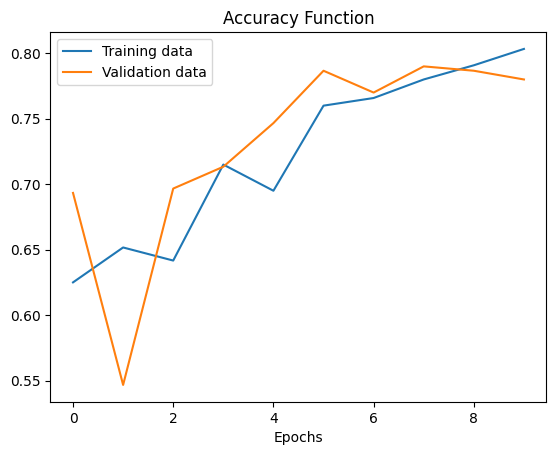

In [107]:
plot_loss_curve(final_history)

In [109]:
def load_image(file_name,model,class_name,image_height=224,image_width=224):
    """
    Read an image from file, turn into a tensor and reshapes it to way to feed into the model
    
    """
    
    # Read in image
    img = tf.io.read_file(file_name)
    
    # Decode the read file into
    img = tf.image.decode_image(img)
    
    
    tf.random.set_seed(42)
    
    # Create model
    converter = tf.keras.Sequential([

        # Creating Augmented image
        tf.keras.layers.Rescaling(1./255),
        tf.keras.layers.RandomFlip(mode='horizontal_and_vertical',
                                   seed=42),
        tf.keras.layers.RandomRotation(factor =(0.2,0.5),
                                      fill_mode ='constant',
                                      interpolation ='bilinear',
                                      fill_value=0.0,  
                                      seed=42),
        tf.keras.layers.RandomCrop(224,224,
                                   seed=42),
        tf.keras.layers.RandomContrast(factor= (0,255),
                                      seed=42),
        tf.keras.layers.RandomZoom(height_factor=(0.2,.5),
                                   fill_mode='constant',
                                   interpolation='bilinear',
                                   fill_value=0.0,
                                   seed=42)

    ])
    
    img_predict = converter(img)  
    
    
    # Coverting in to 4d due to batch size
    img_predict = tf.expand_dims(img_predict,axis=0)
    
    
    
    pridiction_value = model.predict(img_predict)
    
    title = class_name[int(np.round(pridiction_value))]
    
    plt.imshow(img)
    plt.title(f'Predicted class:{title}')
    plt.axis(False)
    
    return 

1/1 [==============================] - 0s 46ms/step


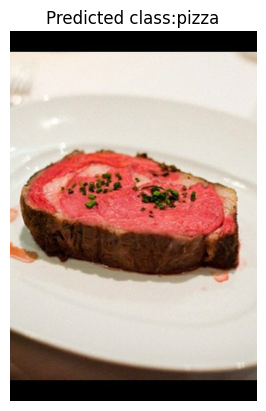

In [124]:
load_image(file_name='141056.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 71ms/step


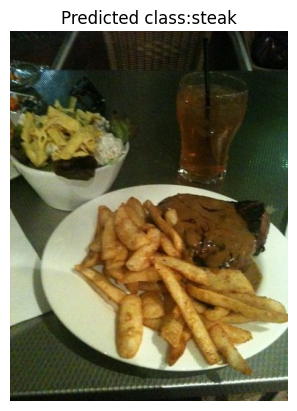

In [111]:
load_image(file_name='141135.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 61ms/step


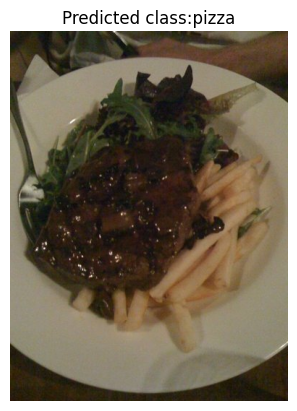

In [112]:
load_image(file_name='143490.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 60ms/step


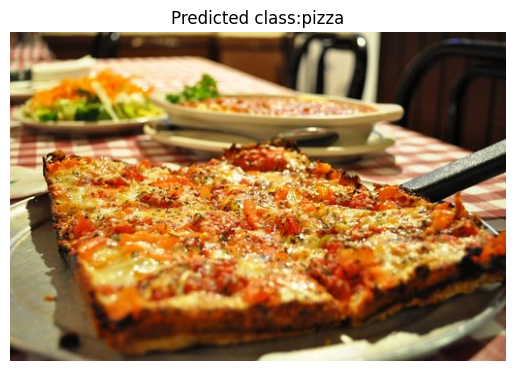

In [113]:
load_image(file_name='724290.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 66ms/step


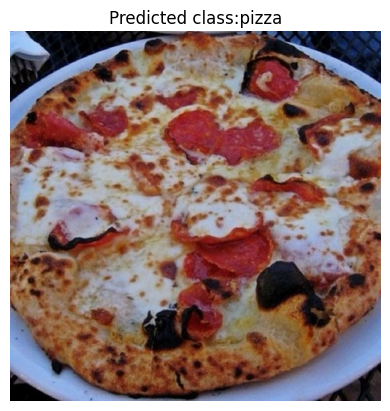

In [114]:
load_image(file_name='728260.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 61ms/step


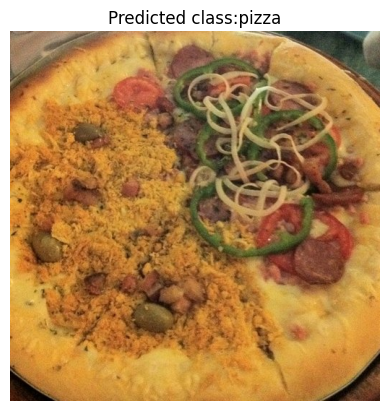

In [115]:
load_image(file_name='849291.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 74ms/step


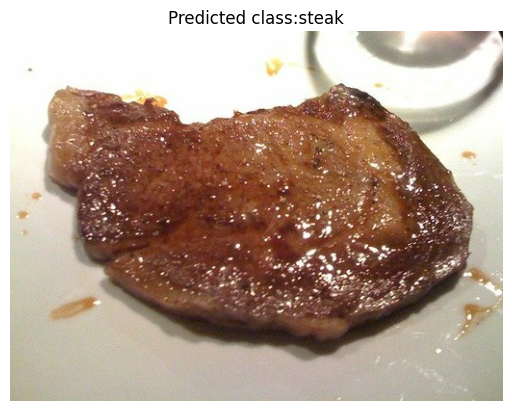

In [116]:
load_image(file_name='13023.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 66ms/step


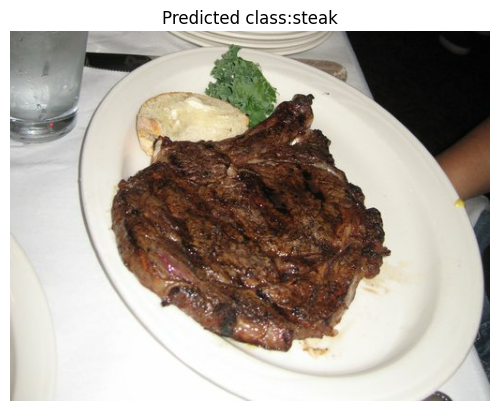

In [117]:
load_image(file_name='13719.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 55ms/step


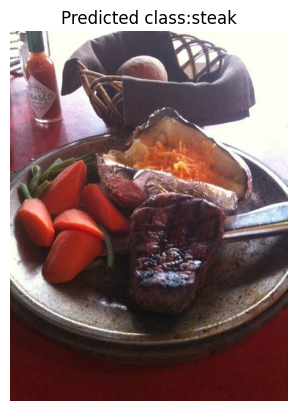

In [123]:
load_image(file_name='30892.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 47ms/step


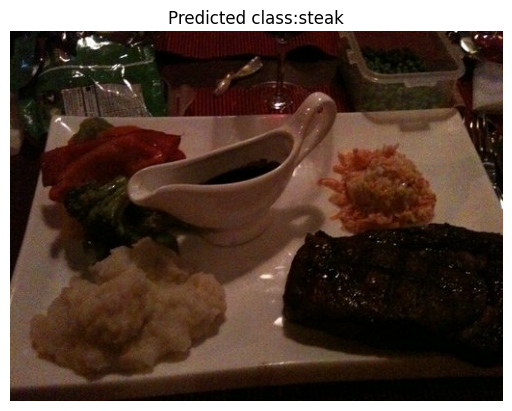

In [122]:
load_image(file_name='36042.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 67ms/step


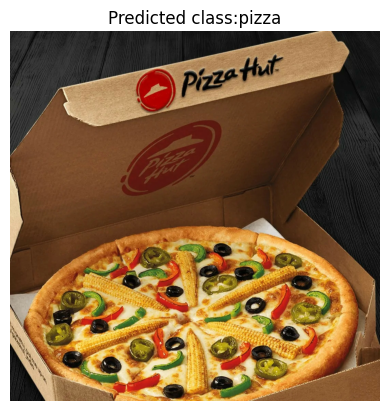

In [120]:
load_image(file_name='a4deqh4e3elgftyiljlj.jpg',
           model= final_model,
           class_name=class_names
          )

1/1 [==============================] - 0s 65ms/step


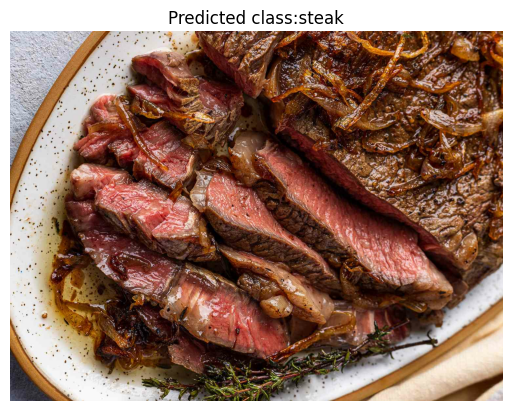

In [121]:
load_image(file_name='butter-basted-pan-seared-steaks-recipe-hero-06-03b1131c58524be2bd6c9851a2fbdbc3.jpg',
           model= final_model,
           class_name=class_names
          )

-------------